# Assignment 8: DT

# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [28]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from chart_studio.plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [29]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [30]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [31]:
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [32]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [33]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [34]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [35]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [36]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [37]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [38]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

My classroom consists of twenty-two amazing sixth graders from different cultures and backgrounds. They are a social bunch who enjoy working in partners and working with groups. They are hard-working and eager to head to middle school next year. My job is to get them ready to make this transition and make it as smooth as possible. In order to do this, my students need to come to school every day and feel safe and ready to learn. Because they are getting ready to head to middle school, I give them lots of choice- choice on where to sit and work, the order to complete assignments, choice of projects, etc. Part of the students feeling safe is the ability for them to come into a welcoming, encouraging environment. My room is colorful and the atmosphere is casual. I want them to take ownership of the classroom because we ALL share it together. Because my time with them is limited, I want to ensure they get the most of this time and enjoy it to the best of their abilities.Currently, we have 

In [39]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [40]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

\"A person is a person, no matter how small.\" (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed. \r\nStudents in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.\r\nOur school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the ear

In [41]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

 A person is a person, no matter how small.  (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed.   Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.  Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the early chi

In [42]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

 A person is a person no matter how small Dr Seuss I teach the smallest students with the biggest enthusiasm for learning My students learn in many different ways using all of our senses and multiple intelligences I use a wide range of techniques to help all my students succeed Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures including Native Americans Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom Kindergarteners in my class love to work with hands on materials and have many different opportunities to practice a skill before it is mastered Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum Montana is the perfect place to learn about agriculture and nutrition My students love to role play in our pretend kitchen in the early childhood classroom

In [43]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [44]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|████████████████████████████████████████████████████████████████████████| 109248/109248 [01:04<00:00, 1683.54it/s]


In [45]:
# after preprocesing
project_data['preprocessed_essays']=preprocessed_essays
preprocessed_essays[20000]

'a person person no matter small dr seuss i teach smallest students biggest enthusiasm learning my students learn many different ways using senses multiple intelligences i use wide range techniques help students succeed students class come variety different backgrounds makes wonderful sharing experiences cultures including native americans our school caring community successful learners seen collaborative student project based learning classroom kindergarteners class love work hands materials many different opportunities practice skill mastered having social skills work cooperatively friends crucial aspect kindergarten curriculum montana perfect place learn agriculture nutrition my students love role play pretend kitchen early childhood classroom i several kids ask can try cooking real food i take idea create common core cooking lessons learn important math writing concepts cooking delicious healthy food snack time my students grounded appreciation work went making food knowledge ingre

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [46]:
preprocessed_titles = []
for sentence in project_data['project_title'].values:
    snt= decontracted(sentence)
    snt= snt.replace('\\r', ' ')
    snt= snt.replace('\\"', ' ')
    snt= snt.replace('\\n', ' ')
    snt= re.sub('[^A-Za-z0-9]+', ' ', snt)
    
    # https://gist.github.com/sebleier/554280
    snt = ' '.join(e for e in snt.split() if e not in stopwords)
    preprocessed_titles.append(snt.lower().strip())

project_data['preprocessed_titles'] = preprocessed_titles
preprocessed_titles[1000]


'empowering students through art learning about then now'

## 1.5 Preparing data for models

In [47]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay',
       'preprocessed_essays', 'preprocessed_titles'],
      dtype='object')

In [48]:
project_data['teacher_prefix'].fillna(" ", inplace = True)
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   <li><b>Task 2: </b>For this task consider set-1 features. Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  Note: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

In [0]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

D:\installed\Anaconda3\lib\site-packages\nltk\twitter\__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

<h1>1. Decision Tree </h1>

## 1.1 Loading Data

In [308]:
from scipy import sparse
from scipy.sparse import csr_matrix
from scipy.sparse import lil_matrix

Y = project_data['project_is_approved'].values
X = project_data

Y = Y[0:60000]
X = X.head(60000)

In [309]:
X.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,preprocessed_titles,price,quantity
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...,i fortunate enough use fairy tale stem kits cl...,engineering steam primary classroom,725.05,4
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...,imagine 8 9 years old you third grade classroo...,sensory tools focus,213.03,8
2,74477,p189804,4a97f3a390bfe21b99cf5e2b81981c73,Mrs.,CA,2016-04-27 00:46:53,Grades PreK-2,Mobile Learning with a Mobile Listening Center,Having a class of 24 students comes with diver...,I have a class of twenty-four kindergarten stu...,...,My students need a mobile listening center to ...,10,1,Literacy_Language,Literacy,Having a class of 24 students comes with diver...,having class 24 students comes diverse learner...,mobile learning mobile listening center,329.00,1
3,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades PreK-2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,My students need flexible seating in the class...,2,1,AppliedLearning,EarlyDevelopment,I recently read an article about giving studen...,i recently read article giving students choice...,flexible seating flexible learning,481.04,9
4,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Grades 3-5,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",...,My students need copies of the New York Times ...,2,1,Literacy_Language,Literacy,"My students crave challenge, they eat obstacle...",my students crave challenge eat obstacles brea...,going deep the art inner thinking,17.74,14


In [310]:
teacher_prefix=[]
for s1 in X['teacher_prefix']:
    s1= s1.replace('.', '')
    teacher_prefix.append(s1.lower().strip())
    
X['teacher_prefix'] = teacher_prefix
X['teacher_prefix'].fillna(" ", inplace = True)
from collections import Counter
my_counter = Counter()
for word in X['teacher_prefix'].values:
    my_counter.update(word.split())
teacher_prefix = dict(my_counter)
teacher_prefix = dict(sorted(teacher_prefix.items(), key=lambda kv: kv[1]))

In [311]:
project_grade=[]
for s1 in X['project_grade_category']:
    s1= s1.replace('Grades', '')
    s1= s1.replace('-', '_')
    project_grade.append(s1.lower().strip())
    
X['project_grade_category'] = project_grade

from collections import Counter
my_counter = Counter()
for word in X['project_grade_category'].values:
    my_counter.update(word.split())
project_grade_category = dict(my_counter)
project_grade_category = dict(sorted(project_grade_category.items(), key=lambda kv: kv[1]))


In [312]:
l =[]
for i in X['essay']:
    words = len(i.split()) 
    l.append(words)
X['essay_len'] = l

In [313]:
l =[]
for i in X['project_title']:
    words = len(i.split()) 
    l.append(words)
X['title_len'] = l

In [314]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import nltk
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = X['preprocessed_essays']
ss =[]
for i in range(0,len(for_sentiment)):
    j= sid.polarity_scores(for_sentiment[i])
    ss.append(j)

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg = []
neu=[]
pos=[]
compound=[]
for k in range(0,len(ss)):
    neg.append(ss[k]['neg'])
    neu.append(ss[k]['neu'])
    pos.append(ss[k]['pos'])
    compound.append(ss[k]['compound'])
    
X['neg']= neg
X['neu']= neu
X['pos']= pos
X['compound']=compound

X.head()

[nltk_data] Downloading package vader_lexicon to C:\Users\Asus
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,preprocessed_essays,preprocessed_titles,price,quantity,essay_len,title_len,neg,neu,pos,compound
0,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,mrs,CA,2016-04-27 00:27:36,prek_2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,...,i fortunate enough use fairy tale stem kits cl...,engineering steam primary classroom,725.05,4,285,6,0.013,0.783,0.205,0.9867
1,37728,p043609,3f60494c61921b3b43ab61bdde2904df,ms,UT,2016-04-27 00:31:25,3_5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",...,imagine 8 9 years old you third grade classroo...,sensory tools focus,213.03,8,345,4,0.072,0.680,0.248,0.9897
2,74477,p189804,4a97f3a390bfe21b99cf5e2b81981c73,mrs,CA,2016-04-27 00:46:53,prek_2,Mobile Learning with a Mobile Listening Center,Having a class of 24 students comes with diver...,I have a class of twenty-four kindergarten stu...,...,having class 24 students comes diverse learner...,mobile learning mobile listening center,329.00,1,177,7,0.017,0.721,0.262,0.9860
3,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,mrs,GA,2016-04-27 00:53:00,prek_2,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,i recently read article giving students choice...,flexible seating flexible learning,481.04,9,225,5,0.030,0.783,0.187,0.9524
4,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,mrs,WA,2016-04-27 01:05:25,3_5,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",...,my students crave challenge eat obstacles brea...,going deep the art inner thinking,17.74,14,184,7,0.029,0.683,0.288,0.9873


<h2>1.2 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [315]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [316]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, shuffle = False) 


print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)


(40200, 28) (40200,)
(19800, 28) (19800,)


In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

<h2>1.3 Make Data Model Ready: encoding numerical, categorical features</h2>

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding 
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [317]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit_transform(X_train['clean_categories'].values)

X_train_cat= vectorizer.transform(X_train['clean_categories'].values)
X_test_cat= vectorizer.transform(X_test['clean_categories'].values)

print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding:")
print(X_train_cat.shape)
print(X_test_cat.shape)

list_feature_names = []
for i in vectorizer.get_feature_names():
    list_feature_names.append(i)
list_feature_names

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encoding:
(40200, 9)
(19800, 9)


['Warmth',
 'Care_Hunger',
 'History_Civics',
 'Music_Arts',
 'AppliedLearning',
 'SpecialNeeds',
 'Health_Sports',
 'Math_Science',
 'Literacy_Language']

In [318]:
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit_transform(project_data['clean_subcategories'].values)

X_train_subcat= vectorizer.transform(X_train['clean_subcategories'].values)
X_test_subcat= vectorizer.transform(X_test['clean_subcategories'].values)

print(vectorizer.get_feature_names())
print("Shape of matrix after one hot encoding:")
print(X_train_subcat.shape)
print(X_test_subcat.shape)

for i in vectorizer.get_feature_names():
    list_feature_names.append(i)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encoding:
(40200, 30)
(19800, 30)


In [319]:
from collections import Counter
my_counter = Counter()
for word in project_data['school_state'].values:
    my_counter.update(word.split())
school_state = dict(my_counter)
school_state = dict(sorted(school_state.items(), key=lambda kv: kv[1]))

vectorizer = CountVectorizer(vocabulary=list(school_state.keys()), lowercase=False, binary=True)
vectorizer.fit((project_data['school_state']).values)
print(vectorizer.get_feature_names())
X_train_school= vectorizer.transform(X_train['school_state'].values)
X_test_school= vectorizer.transform(X_test['school_state'].values)


print("Shape of matrix after one hot encoding: ")
print(X_train_school.shape)
print(X_test_school.shape)

for i in vectorizer.get_feature_names():
    list_feature_names.append(i)


['VT', 'WY', 'ND', 'MT', 'RI', 'SD', 'NE', 'DE', 'AK', 'NH', 'WV', 'ME', 'HI', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR', 'CO', 'MN', 'OR', 'KY', 'MS', 'NV', 'MD', 'CT', 'TN', 'UT', 'AL', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'WA', 'MA', 'LA', 'OH', 'MO', 'IN', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'NY', 'TX', 'CA']
Shape of matrix after one hot encoding: 
(40200, 51)
(19800, 51)


In [320]:

vectorizer = CountVectorizer(vocabulary= list(teacher_prefix.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['teacher_prefix'])
print(vectorizer.get_feature_names())

X_train_teacher= vectorizer.transform(X_train['teacher_prefix'].values)
X_test_teacher= vectorizer.transform(X_test['teacher_prefix'].values)

print("Shape of matrix after one hot encoding ")

print(X_train_teacher.shape)
print(X_test_teacher.shape)

print(X_train_teacher[:5])

['dr', 'teacher', 'mr', 'ms', 'mrs']
Shape of matrix after one hot encoding 
(40200, 5)
(19800, 5)
  (0, 4)	1
  (1, 3)	1
  (2, 4)	1
  (3, 4)	1
  (4, 4)	1


In [321]:

vectorizer = CountVectorizer(vocabulary=list(project_grade_category.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['project_grade_category'])
print(vectorizer.get_feature_names())

X_train_grade= vectorizer.transform(X_train['project_grade_category'].values)
X_test_grade= vectorizer.transform(X_test['project_grade_category'].values)

print("Shape of matrix after one hot encoding ")

print(X_train_grade.shape)
print(X_test_grade.shape)

print(X_train_grade[:5])

['9_12', '6_8', '3_5', 'prek_2']
Shape of matrix after one hot encoding 
(40200, 4)
(19800, 4)
  (0, 3)	1
  (1, 2)	1
  (2, 3)	1
  (3, 3)	1
  (4, 2)	1


In [322]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(1,-1))
X_train_price = normalizer.transform(X_train['price'].values.reshape(1,-1))
X_test_price = normalizer.transform(X_test['price'].values.reshape(1,-1))

print("After vectorizations:")
print(X_train_price.shape, y_train.shape)
print(X_test_price.shape, y_test.shape)
print("="*50)

list_feature_names.append("price")

After vectorizations:
(1, 40200) (40200,)
(1, 19800) (19800,)


In [323]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['quantity'].values.reshape(1,-1))
X_train_quantity = normalizer.transform(X_train['quantity'].values.reshape(1,-1))
X_test_quantity = normalizer.transform(X_test['quantity'].values.reshape(1,-1))

print("After vectorizations:")
print(X_train_quantity.shape, y_train.shape)
print(X_test_quantity.shape, y_test.shape)
print("="*50)

list_feature_names.append("quantity")

After vectorizations:
(1, 40200) (40200,)
(1, 19800) (19800,)


In [324]:

from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_train_previous = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_test_previous = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

print("After vectorizations:")
print(X_train_previous.shape, y_train.shape)
print(X_test_previous.shape, y_test.shape)
print("="*50)

list_feature_names.append("teacher_number_of_previously_posted_projects")

After vectorizations:
(1, 40200) (40200,)
(1, 19800) (19800,)


In [327]:
X_train_num_bow = np.hstack((X_train_price.reshape(-1,1),X_train_quantity.reshape(-1,1),X_train_previous.reshape(-1,1)))
X_test_num_bow = np.hstack((X_test_price.reshape(-1,1),X_test_quantity.reshape(-1,1),X_test_previous.reshape(-1,1)))



In [328]:
from scipy.sparse import hstack

X_train_features = hstack((X_train_cat, X_train_subcat,X_train_school,X_train_teacher,X_train_grade,X_train_num_bow)).tocsr()
X_test_features = hstack((X_test_cat, X_test_subcat,X_test_school,X_test_teacher,X_test_grade,X_test_num_bow)).tocsr()

#X_features= X_features.tocsr()[0:10000,]


print("Final Data matrix")
print(X_train_features.shape, y_train.shape)
print(X_test_features.shape, y_test.shape)
print("="*100)



Final Data matrix
(40200, 102) (40200,)
(19800, 102) (19800,)


In [329]:
X_train_features_set5 = hstack((X_train_features,X_train['neg'].values.reshape(-1,1),X_train['neu'].values.reshape(-1,1),X_train['pos'].values.reshape(-1,1),X_train['compound'].values.reshape(-1,1)))
X_test_features_set5 = hstack((X_test_features,X_test['neg'].values.reshape(-1,1),X_test['neu'].values.reshape(-1,1),X_test['pos'].values.reshape(-1,1),X_test['compound'].values.reshape(-1,1)))

print("Final Data matrix")
print(X_train_features_set5.shape, y_train.shape)
print(X_test_features_set5.shape, y_test.shape)
print("="*100)


Final Data matrix
(40200, 106) (40200,)
(19800, 106) (19800,)


In [330]:
list_feature_names.append("neg")
list_feature_names.append("neu")
list_feature_names.append("pos")
list_feature_names.append("compound")
list_feature_names

['Warmth',
 'Care_Hunger',
 'History_Civics',
 'Music_Arts',
 'AppliedLearning',
 'SpecialNeeds',
 'Health_Sports',
 'Math_Science',
 'Literacy_Language',
 'Economics',
 'CommunityService',
 'FinancialLiteracy',
 'ParentInvolvement',
 'Extracurricular',
 'Civics_Government',
 'ForeignLanguages',
 'NutritionEducation',
 'Warmth',
 'Care_Hunger',
 'SocialSciences',
 'PerformingArts',
 'CharacterEducation',
 'TeamSports',
 'Other',
 'College_CareerPrep',
 'Music',
 'History_Geography',
 'Health_LifeScience',
 'EarlyDevelopment',
 'ESL',
 'Gym_Fitness',
 'EnvironmentalScience',
 'VisualArts',
 'Health_Wellness',
 'AppliedSciences',
 'SpecialNeeds',
 'Literature_Writing',
 'Mathematics',
 'Literacy',
 'VT',
 'WY',
 'ND',
 'MT',
 'RI',
 'SD',
 'NE',
 'DE',
 'AK',
 'NH',
 'WV',
 'ME',
 'HI',
 'DC',
 'NM',
 'KS',
 'IA',
 'ID',
 'AR',
 'CO',
 'MN',
 'OR',
 'KY',
 'MS',
 'NV',
 'MD',
 'CT',
 'TN',
 'UT',
 'AL',
 'WI',
 'VA',
 'AZ',
 'NJ',
 'OK',
 'WA',
 'MA',
 'LA',
 'OH',
 'MO',
 'IN',
 'PA',
 

<h2>1.4 Make Data Model Ready: encoding essay, and project_title</h2>

## TFIDF

In [331]:
X_train_text = X_train['preprocessed_essays']
X_test_text = X_test['preprocessed_essays']

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(X_train_text) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_tfidf = vectorizer.transform(X_train_text)
X_test_tfidf = vectorizer.transform(X_test_text)

print("After vectorizations")
print(X_train_tfidf.shape, y_train.shape)
print(X_test_tfidf.shape, y_test.shape)
print("="*100)

for i in vectorizer.get_feature_names():
    list_feature_names.append(i)


After vectorizations
(40200, 11135) (40200,)
(19800, 11135) (19800,)


In [332]:
X_train_text = X_train['preprocessed_titles']
X_test_text = X_test['preprocessed_titles']

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
vectorizer.fit(X_train_text) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_tfidf2 = vectorizer.transform(X_train_text)
X_test_tfidf2 = vectorizer.transform(X_test_text)

print("After vectorizations")
print(X_train_tfidf2.shape, y_train.shape)
print(X_test_tfidf2.shape, y_test.shape)
print("="*100)

for i in vectorizer.get_feature_names():
    list_feature_names.append(i)


After vectorizations
(40200, 1777) (40200,)
(19800, 1777) (19800,)


In [333]:
X_train_features_tfidf = hstack((X_train_features_set5, X_train_tfidf, X_train_tfidf2))
X_test_features_tfidf = hstack((X_test_features_set5, X_test_tfidf, X_test_tfidf2))



## TFIDF Word2Vec

In [334]:
X_train_text = X_train['preprocessed_essays']
X_test_text = X_test['preprocessed_essays']

In [335]:
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [336]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train_text)
tfidf_model.transform(X_train_text)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidf_w2v_vectors = []; 
for sentence in tqdm(X_train_text): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

X_train_features_tfidfw2v = hstack((X_train_features_set5, tfidf_w2v_vectors))

100%|███████████████████████████████████████████████████████████████████████████| 40200/40200 [01:38<00:00, 409.15it/s]


40200
300


In [337]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train_text)
tfidf_model.transform(X_test_text)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidf_w2v_vectors = []; 
for sentence in tqdm(X_test_text): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

X_test_features_tfidfw2v = hstack((X_test_features_set5, tfidf_w2v_vectors))


100%|███████████████████████████████████████████████████████████████████████████| 19800/19800 [00:47<00:00, 416.85it/s]


19800
300


In [338]:
X_train_text = X_train['preprocessed_titles']
X_test_text = X_test['preprocessed_titles']

In [339]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train_text)
tfidf_model.transform(X_train_text)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidf_w2v_vectors = []; 
for sentence in tqdm(X_train_text): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

X_train_features_tfidfw2v = hstack((X_train_features_set5, tfidf_w2v_vectors))


100%|█████████████████████████████████████████████████████████████████████████| 40200/40200 [00:01<00:00, 27532.58it/s]


40200
300


In [340]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train_text)
tfidf_model.transform(X_test_text)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

tfidf_w2v_vectors = []; 
for sentence in tqdm(X_test_text): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

print(len(tfidf_w2v_vectors))
print(len(tfidf_w2v_vectors[0]))

X_test_features_tfidfw2v = hstack((X_test_features_set5, tfidf_w2v_vectors))


100%|█████████████████████████████████████████████████████████████████████████| 19800/19800 [00:00<00:00, 27993.46it/s]


19800
300


All the features have been encoded and vectorized.

<h2>1.5 Appling  Decision Tree on different kind of featurization as mentioned in the instructions</h2>

<br>Apply  Decision Tree on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [341]:
%matplotlib inline
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

## TFIDF

In [342]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

min_samples_split = [5,10,100,500]
max_depth = [1,5,10,50]
parameters = {'min_samples_split': min_samples_split, 'max_depth':max_depth}
tree = DecisionTreeClassifier(class_weight = 'balanced')
clf = GridSearchCV(tree, parameters, cv=3, scoring='roc_auc')
clf.fit(X_train_features_tfidf, y_train)
best_split = clf.best_estimator_.get_params()['min_samples_split']
best_depth = clf.best_estimator_.get_params()['max_depth']
print('Best Split:', best_split)
print('Best Depth:', best_depth)


train_auc = []
cv_auc = []
for i in range(0,16,4):
    train_auc.append(clf.cv_results_['mean_train_score'][i])
    cv_auc.append(clf.cv_results_['mean_test_score'][i])

trace1 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')


Best Split: 500
Best Depth: 10


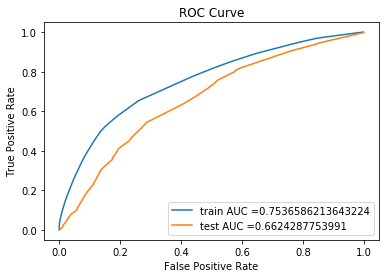

In [355]:

from sklearn.metrics import roc_curve, auc


tree = DecisionTreeClassifier(class_weight = 'balanced',min_samples_split= 500, max_depth = 10)
tree.fit(X_train_features_tfidf, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred_tfidf =  tree.predict_proba(X_train_features_tfidf)[:,1]
y_test_pred_tfidf = tree.predict_proba(X_test_features_tfidf)[:,1]
train_fpr, train_tpr, thresholds = roc_curve(y_train, y_train_pred_tfidf)
test_fpr, test_tpr, thresholds = roc_curve(y_test, y_test_pred_tfidf)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

print("="*100)



In [356]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

the maximum value of tpr*(1-fpr) 0.4831013786729775 for threshold 0.409
Train confusion matrix
[[ 3604  2574]
 [ 8094 25928]]


Text(0.5,1,'Train Confusion Matrix')

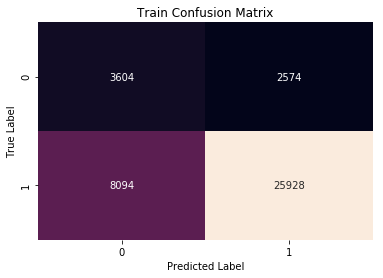

In [357]:
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(thresholds, train_fpr, train_tpr)

print("Train confusion matrix")
matrix_train= confusion_matrix(y_train, predict_with_best_t(y_train_pred_tfidf, best_t))
print(matrix_train)
sns.heatmap(matrix_train,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Train Confusion Matrix')



Test confusion matrix
[[ 1972  1385]
 [ 5894 10549]]


Text(0.5,1,'Test Confusion Matrix')

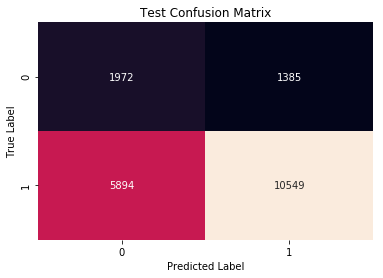

In [358]:

print("Test confusion matrix")
matrix_test= confusion_matrix(y_test, predict_with_best_t(y_test_pred_tfidf, best_t))
print(matrix_test)
sns.heatmap(matrix_test,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Test Confusion Matrix')

In [359]:
fp = X_test[(y_test == 0) & (y_test_pred_tfidf > 0.409)]


In [360]:
fp.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,preprocessed_essays,preprocessed_titles,price,quantity,essay_len,title_len,neg,neu,pos,compound
40202,56739,p184684,78901498caa47caba15bb1f28322bcae,mrs,FL,2016-09-01 00:02:35,prek_2,Differentiated Instruction is the Key to Stude...,I teach Kindergarten at a Title 1 school. The ...,In my Kindergarten class I implement reading d...,...,i teach kindergarten title 1 school the majori...,differentiated instruction key student success,496.99,3,347,8,0.026,0.733,0.241,0.9924
40207,122428,p126905,66abe51a2513e5fb5fdfc742a79f320f,ms,CA,2016-09-01 00:02:37,9_12,SAY CHEESE!,My students are hard working students. They ar...,Our yearbook class needs your help! We are wor...,...,my students hard working students they critica...,say cheese,245.99,1,213,2,0.069,0.612,0.319,0.9892
40226,30407,p239435,e41f2a6e103a0398aa47c45b08bf6c14,mrs,UT,2016-09-01 00:02:55,prek_2,I Only Come to School For Science,My students have many challenges. I teach Kin...,I need these science materials for my science ...,...,my students many challenges i teach kindergart...,i only come school for science,269.48,7,299,7,0.068,0.633,0.299,0.9912
40243,99765,p033267,41c0db73506082a874ce55e1fc98f4e9,mrs,CA,2016-09-01 00:03:22,prek_2,READ! Building our classroom library one book...,My students are eager and bright 5 to 6 year o...,"As a new Kindergarten teacher, my classroom i...",...,my students eager bright 5 6 year olds beginni...,read building classroom library one book time,795.99,12,220,10,0.024,0.595,0.382,0.9948
40246,115402,p218373,bb2e0e2bd407b63779b5f1ac7432c00b,mrs,CA,2016-09-01 00:03:26,9_12,The Insides and Outs of Animals,"My students are high-achieving, creative, and ...",Students need hands-on experiences to help the...,...,my students high achieving creative driven tee...,the insides outs animals,127.38,215,269,6,0.076,0.661,0.263,0.9880


In [361]:
for val in fp['preprocessed_essays']:
    val= str(val)
    words = str(words) + val
    

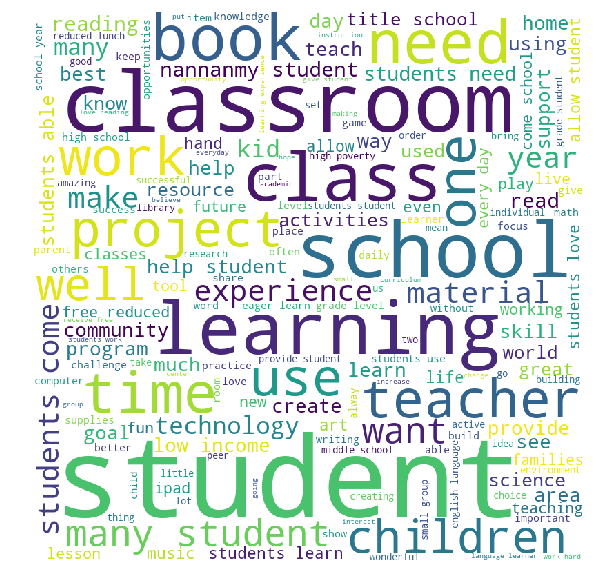

In [362]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate(words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

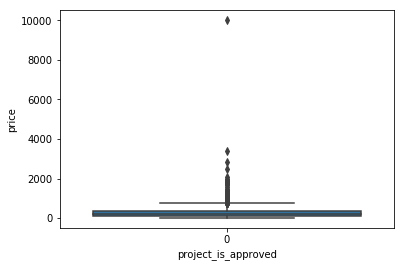

In [363]:
sns.boxplot(x='project_is_approved',y='price', data=fp)
plt.show()

The most number of projects are in the interquartile range concentrated around prices below the 500 mark, with maximum around 1000, but a few outlier projects having higher than a price of 1000$.

In [364]:
fp1= fp.loc[fp["project_is_approved"] == 0];


PDF: [0.93790614 0.03971119 0.00938628 0.00577617 0.00361011 0.00216606
 0.         0.         0.         0.00144404]
Bin edges: [  0.   26.2  52.4  78.6 104.8 131.  157.2 183.4 209.6 235.8 262. ]


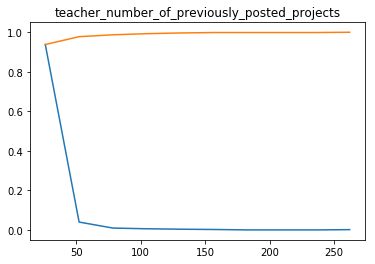

In [365]:

counts, bin_edges = np.histogram(fp1['teacher_number_of_previously_posted_projects'], bins=10, density = True)
pdf = counts/(sum(counts))
print("PDF:",pdf);
print("Bin edges:", bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:], pdf);
plt.plot(bin_edges[1:], cdf);
plt.title("teacher_number_of_previously_posted_projects")

plt.show()

Almost all posted projects lie below the 70 mark, but the highest number of posted projects by a teacher is around 260.

## TFIDFW2V

In [354]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

min_samples_split = [5,10,100,500]
max_depth = [1,5,10,50]
parameters = {'min_samples_split': min_samples_split, 'max_depth':max_depth}
tree = DecisionTreeClassifier()
clf = GridSearchCV(tree, parameters, cv=3, scoring='roc_auc')
clf.fit(X_train_features_tfidfw2v, y_train)
best_split = clf.best_estimator_.get_params()['min_samples_split']
best_depth = clf.best_estimator_.get_params()['max_depth']
print('Best Split:', best_split)
print('Best Depth:', best_depth)


train_auc = []
cv_auc = []

for i in range(0,16,4):
    train_auc.append(clf.cv_results_['mean_train_score'][i])
    cv_auc.append(clf.cv_results_['mean_test_score'][i])

trace1 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')


Best Split: 5
Best Depth: 5


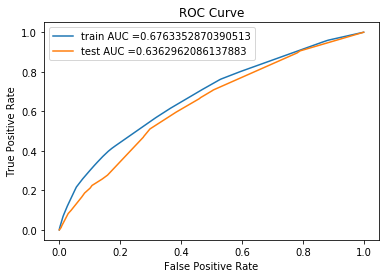

In [366]:

from sklearn.metrics import roc_curve, auc


tree = DecisionTreeClassifier(class_weight = 'balanced',min_samples_split= 5, max_depth = 5)
tree.fit(X_train_features_tfidfw2v, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred_tfidfw2v =  tree.predict_proba(X_train_features_tfidfw2v)[:,1]
y_test_pred_tfidfw2v = tree.predict_proba(X_test_features_tfidfw2v)[:,1]
train_fpr, train_tpr, thresholds = roc_curve(y_train, y_train_pred_tfidfw2v)
test_fpr, test_tpr, thresholds = roc_curve(y_test, y_test_pred_tfidfw2v)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

print("="*100)



the maximum value of tpr*(1-fpr) 0.39069246968507937 for threshold 0.344
Train confusion matrix
[[  741  5437]
 [ 1423 32599]]


Text(0.5,1,'Train Confusion Matrix')

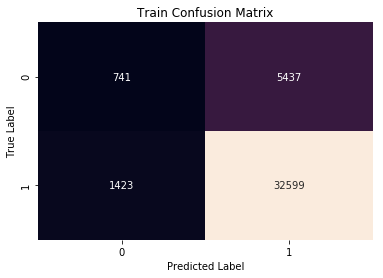

In [367]:
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(thresholds, train_fpr, train_tpr)

print("Train confusion matrix")
matrix_train= confusion_matrix(y_train, predict_with_best_t(y_train_pred_tfidfw2v, best_t))
print(matrix_train)
sns.heatmap(matrix_train,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Train Confusion Matrix')



Test confusion matrix
[[  704  2653]
 [ 1567 14876]]


Text(0.5,1,'Test Confusion Matrix')

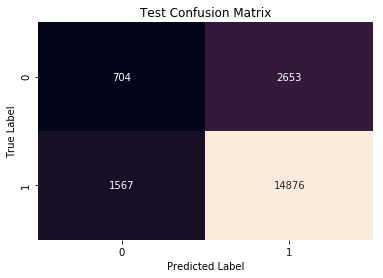

In [368]:

print("Test confusion matrix")
matrix_test= confusion_matrix(y_test, predict_with_best_t(y_test_pred_tfidfw2v, best_t))
print(matrix_test)
sns.heatmap(matrix_test,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Test Confusion Matrix')

In [411]:
fp = X_test[(y_test == 0) & (y_test_pred_tfidfw2v > 0.344)]

In [370]:
for val in fp['preprocessed_essays']:
    val= str(val)
    words = str(words) + val
    

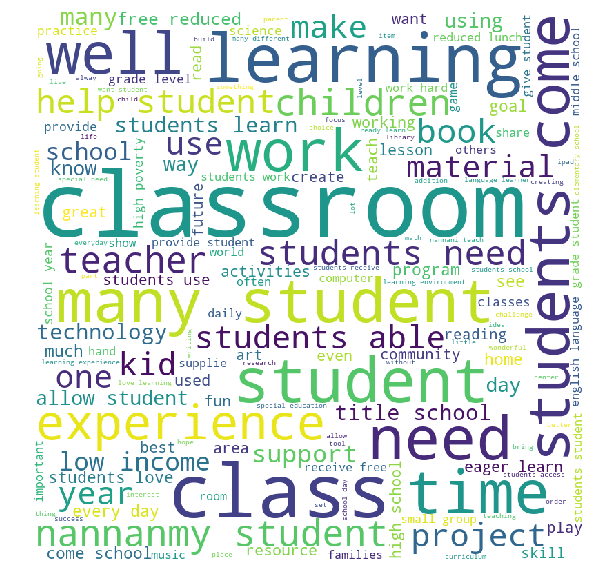

In [371]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate(words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

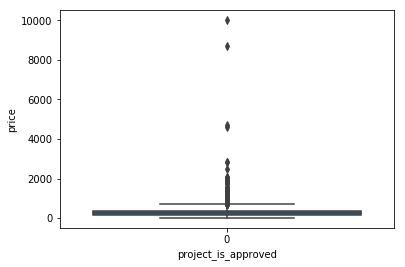

In [372]:
sns.boxplot(x='project_is_approved',y='price', data=fp)
plt.show()

The most number of projects are in the interquartile range concentrated around prices below the 500 mark, with maximum around 1000, but a few outlier projects having a much higher than a price of 1000, with the most going till 10000$.

In [373]:
fp1= fp.loc[fp["project_is_approved"] == 0];


PDF: [9.61176027e-01 2.33697701e-02 6.40784018e-03 4.14624953e-03
 1.13079533e-03 2.26159065e-03 0.00000000e+00 1.13079533e-03
 0.00000000e+00 3.76931775e-04]
Bin edges: [  0.   34.3  68.6 102.9 137.2 171.5 205.8 240.1 274.4 308.7 343. ]


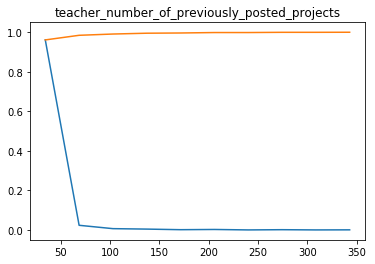

In [374]:

counts, bin_edges = np.histogram(fp1['teacher_number_of_previously_posted_projects'], bins=10, density = True)
pdf = counts/(sum(counts))
print("PDF:",pdf);
print("Bin edges:", bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:], pdf);
plt.plot(bin_edges[1:], cdf);
plt.title("teacher_number_of_previously_posted_projects")

plt.show()

Almost all posted projects lie below the 70 mark, but the highest number of posted projects by a teacher is around 340.

<h2>1.6 Getting top features using `feature_importances_`</h2>

In [0]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [384]:
tree = DecisionTreeClassifier(class_weight = 'balanced', min_samples_split = 500)
tree.fit(X_train_features_tfidf, y_train)
imp=tree.feature_importances_

In [385]:
imp_features= dict(zip(list_feature_names, imp))
nonzero = {k: v for k, v in imp_features.items() if v !=0}


In [386]:
f=[]
for k, v in nonzero.items():
    f.append(k)

In [387]:
imp_index=[]
for i in list_feature_names:
    if i in f:
        imp_index.append(list_feature_names.index(i))
        

In [403]:
X_tr = X_train_features_tfidf.tocsr()[:, imp_index]
X_te = X_test_features_tfidf.tocsr()[:, imp_index]

In [406]:
print(X_tr.shape)
print(X_te.shape)

(40200, 741)
(19800, 741)


In [404]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

min_samples_split = [5,10,100,500]
max_depth = [1,5,10,50]
parameters = {'min_samples_split': min_samples_split, 'max_depth':max_depth}
tree = DecisionTreeClassifier(class_weight = 'balanced')
clf = GridSearchCV(tree, parameters, cv=3, scoring='roc_auc')
clf.fit(X_tr, y_train)
best_split = clf.best_estimator_.get_params()['min_samples_split']
best_depth = clf.best_estimator_.get_params()['max_depth']
print('Best Split:', best_split)
print('Best Depth:', best_depth)


train_auc = []
cv_auc = []
for i in range(0,16,4):
    train_auc.append(clf.cv_results_['mean_train_score'][i])
    cv_auc.append(clf.cv_results_['mean_test_score'][i])

trace1 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=np.log(min_samples_split),y=np.log(max_depth),z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')


Best Split: 500
Best Depth: 10


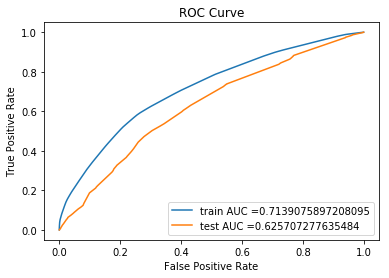

In [407]:
from sklearn.metrics import roc_curve, auc


tree = DecisionTreeClassifier(class_weight = 'balanced',min_samples_split= 500, max_depth = 10)
tree.fit(X_tr , y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred  =  tree.predict_proba(X_tr)[:,1]
y_test_pred = tree.predict_proba(X_te)[:,1]
train_fpr, train_tpr, thresholds = roc_curve(y_train, y_train_pred )
test_fpr, test_tpr, thresholds = roc_curve(y_test, y_test_pred )

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.show()

print("="*100)


In [69]:
#https://getaravind.com/blog/confusion-matrix-seaborn-heatmap/

the maximum value of tpr*(1-fpr) 0.4368253786768597 for threshold 0.44
Train confusion matrix
[[ 3697  2481]
 [ 9955 24067]]


Text(0.5,1,'Train Confusion Matrix')

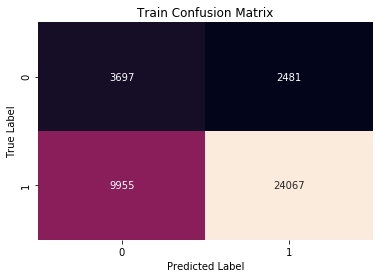

In [408]:
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(thresholds, train_fpr, train_tpr)

print("Train confusion matrix")
matrix_train= confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
print(matrix_train)
sns.heatmap(matrix_train,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Train Confusion Matrix')


Test confusion matrix
[[ 1907  1450]
 [ 6075 10368]]


Text(0.5,1,'Test Confusion Matrix')

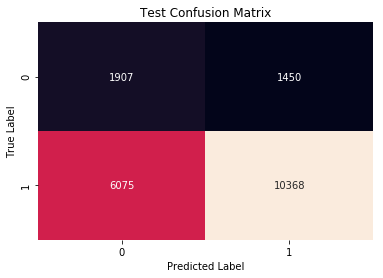

In [409]:
print("Test confusion matrix")
matrix_test= confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
print(matrix_test)
sns.heatmap(matrix_test,annot=True,cbar=False,fmt='d')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Test Confusion Matrix')

In [413]:
fp = X_test[(y_test == 0) & (y_test_pred> 0.44)]

In [414]:
for val in fp['preprocessed_essays']:
    val= str(val)
    words = str(words) + val
    

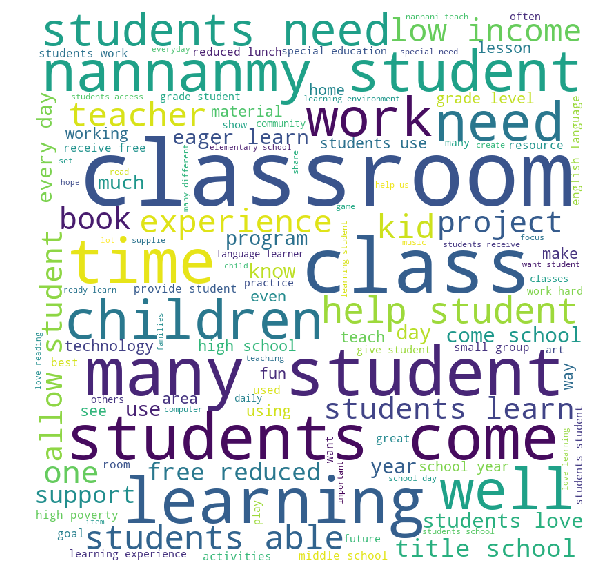

In [415]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate(words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

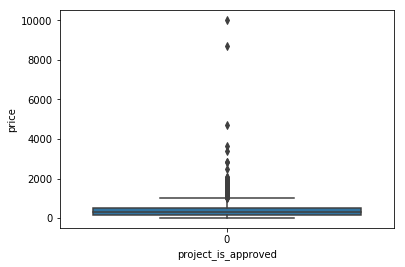

In [417]:
sns.boxplot(x='project_is_approved',y='price', data=fp)
plt.show()

The most number of projects are in the interquartile range concentrated around prices below the 500 mark, with maximum around 1000, but a few outlier projects having a much higher than a price of 1000, with the most going till 10000$.

In [418]:
fp1= fp.loc[fp["project_is_approved"] == 0];


PDF: [9.38818565e-01 3.51617440e-02 9.84528833e-03 7.03234880e-03
 2.10970464e-03 4.21940928e-03 0.00000000e+00 2.10970464e-03
 0.00000000e+00 7.03234880e-04]
Bin edges: [  0.   34.3  68.6 102.9 137.2 171.5 205.8 240.1 274.4 308.7 343. ]


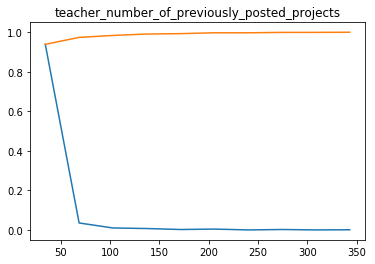

In [419]:

counts, bin_edges = np.histogram(fp1['teacher_number_of_previously_posted_projects'], bins=10, density = True)
pdf = counts/(sum(counts))
print("PDF:",pdf);
print("Bin edges:", bin_edges);
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:], pdf);
plt.plot(bin_edges[1:], cdf);
plt.title("teacher_number_of_previously_posted_projects")

plt.show()

Almost all posted projects lie below the 70 mark, but the highest number of posted projects by a teacher is around 340.

<h1>2. Summary</h1>

In [394]:
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Vectorizer", "Model", "Min_samples_split","Max_depth", "AUC"]


x.add_row(["TFIDF", "Decision trees", "500",10, 0.66])
x.add_row(["TFIDFW2V", "Decision trees", "5",5, 0.63])
x.add_row(["TFIDF Important features","Decision Trees", "500",10, 0.62])


print(x)

+--------------------------+----------------+-------------------+-----------+------+
|        Vectorizer        |     Model      | Min_samples_split | Max_depth | AUC  |
+--------------------------+----------------+-------------------+-----------+------+
|          TFIDF           | Decision trees |        500        |     10    | 0.66 |
|         TFIDFW2V         | Decision trees |         5         |     5     | 0.63 |
| TFIDF Important features |    Logistic    |        500        |     10    | 0.62 |
+--------------------------+----------------+-------------------+-----------+------+


The Logistic model with the important nonzero features have the most AUC, hence best model out of these three.